In [1]:
import yfinance as yf
import pandas as pd

def ingest_ohlc_data(stocks, start_date, end_date):
    
    data = {}
    for stock in stocks:
        try:
            # Fetch OHLC data
            df = yf.download(stock, start=start_date, end=end_date)
            
            # Validate data integrity
            missing_values = df.isnull().sum().sum()
            if missing_values > 0:
                print(f"Warning: Found {missing_values} missing values in {stock} data.")
            
            # Standardize data format
            df.reset_index(inplace=True)
            data[stock] = df
            
            print(f"Fetched and standardized data for {stock}")
        except Exception as e:
            print(f"Failed to fetch data for {stock}: {e}")
    return data



In [2]:
import pandas as pd
import numpy as np

def clean_ohlc_data(data):
    
    cleaned_data = {}
    for stock, df in data.items():
        # Handle missing values by forward filling
        df.fillna(method='ffill', inplace=True)
        
        # Exclude non-numeric columns from z-score calculation
        numeric_cols = df.select_dtypes(include=np.number).columns
        z_scores = (df[numeric_cols] - df[numeric_cols].mean()) / df[numeric_cols].std()
        
        # Detect and correct outliers using z-score
        outliers = z_scores.abs() > 3
        df.loc[outliers.any(axis=1), numeric_cols] = np.nan  # Replace outliers with NaN
        
        # Handle any remaining missing values after outlier correction
        df.fillna(method='ffill', inplace=True)
        
        cleaned_data[stock] = df
    return cleaned_data




In [3]:
import pandas as pd
import numpy as np
import ta

def transform_data(cleaned_data, resample_freq='D'):
    
    transformed_data = {}
    for stock, df in cleaned_data.items():
        # Ensure datetime index
        df['Date'] = pd.to_datetime(df['Date'])
        df.set_index('Date', inplace=True)
        
        # Calculate technical indicators
        df['SMA_50'] = ta.trend.sma_indicator(df['Close'], window=50)
        df['SMA_200'] = ta.trend.sma_indicator(df['Close'], window=200)
        df['BB_upper'], df['BB_middle'], df['BB_lower'] = ta.volatility.bollinger_hband_indicator(df['Close']), ta.volatility.bollinger_mavg(df['Close']), ta.volatility.bollinger_lband_indicator(df['Close'])
        df['RSI'] = ta.momentum.rsi(df['Close'])
        
        # Apply feature engineering techniques
        df['Volatility'] = df['Close'].rolling(window=50).std()
        df['Price_Change'] = df['Close'].pct_change()
        
        # Resample the data
        df_resampled = df.resample(resample_freq).agg({
            'Open': 'first',
            'High': 'max',
            'Low': 'min',
            'Close': 'last',
            'Volume': 'sum',
            'SMA_50': 'last',
            'SMA_200': 'last',
            'BB_upper': 'last',
            'BB_middle': 'last',
            'BB_lower': 'last',
            'RSI': 'last',
            'Volatility': 'last',
            'Price_Change': 'last'
        })
        
        transformed_data[stock] = df_resampled
    
    return transformed_data



In [4]:
import unittest
from datetime import datetime

class TestPipeline(unittest.TestCase):
    def setUp(self):
        # Set up test data
        self.stocks = ['AAPL']
        self.start_date = '2022-01-01'
        self.end_date = '2022-01-10'
        self.resample_freq = 'D'

    def test_ingest_ohlc_data(self):
        # Test data ingestion
        ohlc_data = ingest_ohlc_data(self.stocks, self.start_date, self.end_date)
        self.assertTrue(isinstance(ohlc_data, dict))
        self.assertEqual(len(ohlc_data), len(self.stocks))

    def test_clean_ohlc_data(self):
        # Test data cleaning
        ohlc_data = ingest_ohlc_data(self.stocks, self.start_date, self.end_date)
        cleaned_data = clean_ohlc_data(ohlc_data)
        self.assertTrue(isinstance(cleaned_data, dict))
        for stock, df in cleaned_data.items():
            self.assertTrue(df.isnull().sum().sum() == 0)

    def test_transform_data(self):
        # Test data transformation
        ohlc_data = ingest_ohlc_data(self.stocks, self.start_date, self.end_date)
        cleaned_data = clean_ohlc_data(ohlc_data)
        transformed_data = transform_data(cleaned_data, self.resample_freq)
        self.assertTrue(isinstance(transformed_data, dict))
        for stock, df in transformed_data.items():
            self.assertTrue('SMA_50' in df.columns)
            self.assertTrue('SMA_200' in df.columns)
            self.assertTrue('BB_upper' in df.columns)
            self.assertTrue('BB_middle' in df.columns)
            self.assertTrue('BB_lower' in df.columns)
            self.assertTrue('RSI' in df.columns)
            self.assertTrue('Volatility' in df.columns)
            self.assertTrue('Price_Change' in df.columns)

    # Add more tests as needed for compression, MongoDB storage, etc.

if __name__ == '__main__':
    unittest.main()


usage: ipykernel_launcher.py [-h] [-v] [-q] [--locals] [-f] [-c] [-b]
                             [-k TESTNAMEPATTERNS]
                             [tests ...]
ipykernel_launcher.py: error: argument -f/--failfast: ignored explicit argument 'c:\\Users\\ashwi\\AppData\\Roaming\\jupyter\\runtime\\kernel-v2-20092MvQUYyYArcD2.json'


AttributeError: 'tuple' object has no attribute 'tb_frame'

In [38]:
import os
import pyarrow.parquet as pq
import matplotlib.pyplot as plt
import seaborn as sns
import pyarrow as pa

def compress_and_store_data(transformed_data, directory):
    
    os.makedirs(directory, exist_ok=True)
    for stock, df in transformed_data.items():
        file_path = os.path.join(directory, f"{stock}.parquet")
        table = pa.Table.from_pandas(df)
        pq.write_table(table, file_path, compression='snappy')
        print(f"Data for {stock} compressed and stored at: {file_path}")


In [52]:
import plotly.graph_objs as go

def visualize_data(transformed_data):
    
    for stock, df in transformed_data.items():
        fig = go.Figure()

        # Add Close Price trace
        fig.add_trace(go.Scatter(x=df.index, y=df['Close'], mode='lines', name='Close Price', line=dict(color='blue')))

        # Add Open Price trace
        fig.add_trace(go.Scatter(x=df.index, y=df['Open'], mode='lines', name='Open Price', line=dict(color='orange')))A

        # Add 50-Day SMA trace
        fig.add_trace(go.Scatter(x=df.index, y=df['SMA_50'], mode='lines', name='50-Day SMA', line=dict(color='red', dash='dash')))

        # Add 200-Day SMA trace
        fig.add_trace(go.Scatter(x=df.index, y=df['SMA_200'], mode='lines', name='200-Day SMA', line=dict(color='green', dash='dash')))

        # Add Bollinger Bands
        fig.add_trace(go.Scatter(x=df.index, y=df['BB_upper'], mode='lines', name='Upper Bollinger Band', line=dict(color='gray')))
        fig.add_trace(go.Scatter(x=df.index, y=df['BB_lower'], mode='lines', name='Lower Bollinger Band', line=dict(color='gray')))

        # Update layout
        fig.update_layout(title=f'OHLC Data Visualization for {stock}',
                          xaxis_title='Date',
                          yaxis_title='Price',
                          legend=dict(orientation='h', yanchor='bottom', y=1.02, xanchor='right', x=1),
                          margin=dict(l=50, r=50, t=50, b=50),
                          hovermode='x unified')

        # Show plot
        fig.show()


In [61]:
import pymongo

# Function to connect to MongoDB
def connect_to_mongodb(database_name, collection_name):
    client = pymongo.MongoClient('mongodb://localhost:27017/')
    db = client[database_name]
    collection = db[collection_name]
    return collection

# Function to insert data into MongoDB collection
def insert_data_into_mongodb(collection, data):
    for stock, df in data.items():
        # Create a copy of the DataFrame with a datetime index
        df_copy = df.copy()
        df_copy.index = pd.to_datetime(df_copy.index)
        
        # Partition data by year and month
        for year, year_group in df_copy.groupby(df_copy.index.year):
            for month, month_group in year_group.groupby(year_group.index.month):
                # Create a document for each year-month partition
                document = {
                    'stock': stock,
                    'year': year,
                    'month': month,
                    'data': month_group.to_dict(orient='records')
                }
                # Insert the document into MongoDB
                collection.insert_one(document)
                
# Create indexes for efficient querying
def create_indexes(collection):
    # Create compound index on stock, year, and month for efficient querying
    collection.create_index([('stock', pymongo.ASCENDING), ('year', pymongo.ASCENDING), ('month', pymongo.ASCENDING)])
    # Optionally, create additional indexes based on specific query patterns




In [63]:
def run_pipeline(stocks, start_date, end_date, resample_freq='D', compression_directory=None, mongodb_uri=None, db_name='financial_data'):
    
    # Step 1: Ingest OHLC data
    ohlc_data = ingest_ohlc_data(stocks, start_date, end_date)
    
    # Step 2: Clean OHLC data
    cleaned_ohlc_data = clean_ohlc_data(ohlc_data)
    
    # Step 3: Transform cleaned OHLC data
    transformed_ohlc_data = transform_data(cleaned_ohlc_data, resample_freq)
    
    # Step 4: Compress and store data if compression directory is provided
    if compression_directory:
        compress_and_store_data(transformed_ohlc_data, compression_directory)
    
    # Step 5: Store data in MongoDB
    if mongodb_uri:
        # Connect to MongoDB
        collection = connect_to_mongodb(db_name, 'ohlc_data')
        # Insert transformed OHLC data into MongoDB collection
        insert_data_into_mongodb(collection, transformed_ohlc_data)
        # Create indexes for efficient querying
        create_indexes(collection)
    
    # Step 6: Visualize data
    visualize_data(transformed_ohlc_data)
    
    return transformed_ohlc_data

# Example usage
stocks = ['AAPL', 'AMZN', 'NFLX', 'GOOG', 'MSFT']
start_date = '1990-01-01'
end_date = '2024-03-27'
resample_freq = 'D'
compression_directory = 'compressed_data'
mongodb_uri = 'mongodb://localhost:27017/'
db_name = 'financial_data'

transformed_data = run_pipeline(stocks, start_date, end_date, resample_freq, compression_directory, mongodb_uri, db_name)

[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed

Fetched and standardized data for AAPL
Fetched and standardized data for AMZN
Fetched and standardized data for NFLX



[*********************100%%**********************]  1 of 1 completed
C:\Users\ashwi\AppData\Local\Temp\ipykernel_23768\3777904176.py:18: FutureWarning:

DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.

C:\Users\ashwi\AppData\Local\Temp\ipykernel_23768\3777904176.py:29: FutureWarning:

DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.



Fetched and standardized data for GOOG
Fetched and standardized data for MSFT
Data for AAPL compressed and stored at: compressed_data\AAPL.parquet
Data for AMZN compressed and stored at: compressed_data\AMZN.parquet
Data for NFLX compressed and stored at: compressed_data\NFLX.parquet
Data for GOOG compressed and stored at: compressed_data\GOOG.parquet
Data for MSFT compressed and stored at: compressed_data\MSFT.parquet


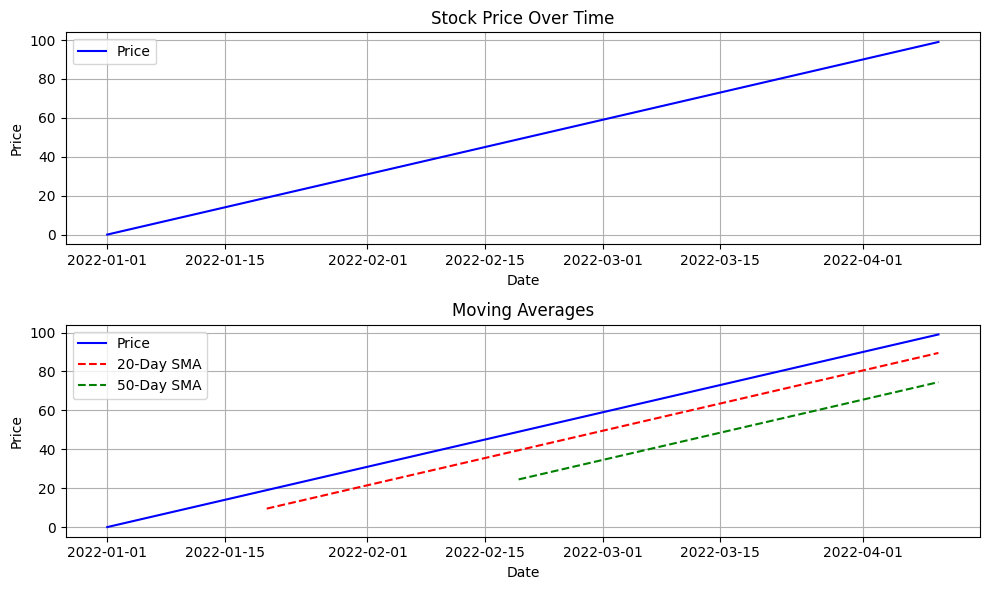

In [56]:
import matplotlib.pyplot as plt
import pandas as pd

# Sample data
dates = pd.date_range('2022-01-01', periods=100)
prices = pd.Series(range(100), index=dates)

# Create visualizations
plt.figure(figsize=(10, 6))

# Plot prices
plt.subplot(2, 1, 1)
plt.plot(prices.index, prices.values, label='Price', color='blue')
plt.title('Stock Price Over Time')
plt.xlabel('Date')
plt.ylabel('Price')
plt.legend()
plt.grid(True)

# Plot moving averages
plt.subplot(2, 1, 2)
rolling_mean_20 = prices.rolling(window=20).mean()
rolling_mean_50 = prices.rolling(window=50).mean()
plt.plot(prices.index, prices.values, label='Price', color='blue')
plt.plot(rolling_mean_20.index, rolling_mean_20.values, label='20-Day SMA', color='red', linestyle='--')
plt.plot(rolling_mean_50.index, rolling_mean_50.values, label='50-Day SMA', color='green', linestyle='--')
plt.title('Moving Averages')
plt.xlabel('Date')
plt.ylabel('Price')
plt.legend()
plt.grid(True)

# Adjust layout
plt.tight_layout()

# Save or display the report
plt.savefig('financial_report.png')  # Save the report as an image file
plt.show()  # Display the report
